**UNIVERSIDADE FEDERAL DO MARANHÃO**

**TÓPICOS EM ENGENHARIA DA COMPUTAÇÃO II - FUNDAMENTOS DE REDES NEURAIS (EECP0053)**

**DOCENTE:** THALES LEVI AZEVEDO VALENTE

**GRUPO REALIZADOR DO TRABALHO:**
*   CAIO REIS BATISTA
*   KATARINA IRES DE CASTRO PINHEIRO
*   MELISSA RODRIGUES PALHANO

# Exploração de Dados do Titanic

Este notebook é dedicado à exploração aprofundada e visualização dos dados do naufrágio do Titanic. O trabalho proposto visa analisar quais características dos passageiros influenciaram significativamente suas chances de sobrevivência e construir um modelo preditivo para classificar sobreviventes.

## Sobre o Problema

O naufrágio do Titanic é um dos desastres marítimos mais conhecidos da história. O objetivo deste estudo é analisar os dados dos passageiros do Titanic para entender quais fatores influenciaram a sobrevivência. O conjunto de dados contém informações como classe, sexo, idade, tarifa, local de embarque, entre outros. O desafio é prever quem sobreviveu ao desastre com base nessas informações.

Além disso, é importante observar que o conjunto de dados apresenta **desbalanceamento** em algumas features, como a proporção de sobreviventes, distribuição entre classes e gêneros, o que pode impactar a análise e a performance dos modelos preditivos.

## 1. Importação das Bibliotecas

In [27]:
# Bibliotecas para manipulação de dados
import numpy as np
import pandas as pd

# Bibliotecas para visualização
import matplotlib.pyplot as plt
import seaborn as sns

# Configurações de visualização
plt.style.use('fivethirtyeight')
sns.set(style='whitegrid')
%matplotlib inline
plt.rcParams['figure.figsize'] = (12, 8)

# Configuração para exibir mais colunas
pd.set_option('display.max_columns', None)

# Bibliotecas para Redes Neurais
from sklearn.preprocessing import StandardScaler
from sklearn.utils.class_weight import compute_class_weight
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.regularizers import l2
from sklearn.metrics import f1_score, recall_score, precision_score, classification_report, confusion_matrix
from sklearn.model_selection import train_test_split
from sklearn.impute import IterativeImputer
from sklearn.ensemble import RandomForestRegressor

## 2. Carregamento dos Dados

In [6]:
# URL dos dados do Titanic
train_url = 'https://raw.githubusercontent.com/datasciencedojo/datasets/master/titanic.csv'

# Carregando os dados
df = pd.read_csv(train_url)

# Exibindo as primeiras linhas do dataset
print(f'Dimensões do dataset: {df.shape}')
df.head()

Dimensões do dataset: (891, 12)


,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
0,1,0,3,"Braund, Mr. Owen Harris",male,22.0,1,0,A/5 21171,7.2500,NaN,S
1,2,1,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",female,38.0,1,0,PC 17599,71.2833,C85,C
2,3,1,3,"Heikkinen, Miss. Laina",female,26.0,0,0,STON/O2. 3101282,7.9250,NaN,S
3,4,1,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35.0,1,0,113803,53.1000,C123,S
4,5,0,3,"Allen, Mr. William Henry",male,35.0,0,0,373450,8.0500,NaN,S


## 3. Exploração Inicial dos Dados

In [7]:
# Informações sobre o dataset
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 891 entries, 0 to 890
Data columns (total 12 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   PassengerId  891 non-null    int64  
 1   Survived     891 non-null    int64  
 2   Pclass       891 non-null    int64  
 3   Name         891 non-null    object 
 4   Sex          891 non-null    object 
 5   Age          714 non-null    float64
 6   SibSp        891 non-null    int64  
 7   Parch        891 non-null    int64  
 8   Ticket       891 non-null    object 
 9   Fare         891 non-null    float64
 10  Cabin        204 non-null    object 
 11  Embarked     889 non-null    object 
dtypes: float64(2), int64(5), object(5)
memory usage: 83.7+ KB


### 3.1 Análise do DataFrame


Acima está um resumo dos nossos dados contidos em um `DataFrame` do `Pandas`. Pense em um `DataFrame` como uma versão turbinada do Python para o fluxo de trabalho de uma tabela do Excel. Como você pode ver, o resumo traz bastante informação. Primeiro, ele nos mostra que temos 891 observações, ou passageiros, para analisar aqui:
    
    Int64Index: 891 entradas, 0 a 890

Depois, ele mostra todas as colunas do `DataFrame`. Cada coluna nos diz algo sobre cada uma das nossas observações, como `nome`, `sexo` ou `idade`. Essas colunas são chamadas de features do nosso conjunto de dados. Você pode considerar as palavras coluna e feature como intercambiáveis neste notebook.

Após cada feature, ele mostra quantos valores ela contém. Enquanto a maioria das features tem dados completos para todas as observações, como a feature `survived`:

    survived    891  valores não nulos

algumas estão com informações faltantes, como a feature `age`:

    age         714  valores não nulos

Esses valores ausentes são representados como `NaN`s.


### 3.2 Lidando com Valores Ausentes


As features `ticket` e `cabin` têm muitos valores ausentes e, portanto, não agregam muito valor à nossa análise. Para lidar com isso, vamos removê-las do dataframe para preservar a integridade do nosso conjunto de dados.

Para isso, usamos esta linha de código para remover as features completamente:

    df = df.drop(['ticket','cabin'], axis=1)

Enquanto esta linha remove os valores `NaN` de todas as colunas/features restantes:
   
    df = df.dropna()
     
Agora temos um conjunto de dados limpo e pronto para análise. Como `.dropna()` remove uma observação mesmo que ela tenha apenas 1 `NaN` em uma das features, a maior parte do nosso conjunto de dados seria removida se não tivéssemos excluído antes as features `ticket` e `cabin`.

In [58]:
df = df.drop(['Ticket','Cabin'], axis=1)
# Remove NaN values
df = df.dropna()

As colunas 'Ticket' e 'Cabin' são removidas devido ao alto número de valores ausentes. Em seguida, todas as linhas com valores faltantes em qualquer coluna restante são excluídas, resultando em um conjunto de dados mais limpo para análise.

In [8]:
# Verificando valores ausentes
missing_values = df.isnull().sum()
missing_percentage = (missing_values / len(df)) * 100

missing_data = pd.DataFrame({
    'Valores Ausentes': missing_values,
    'Porcentagem (%)': missing_percentage.round(2)
})

missing_data[missing_data['Valores Ausentes'] > 0].sort_values('Porcentagem (%)', ascending=False)

,Valores Ausentes,Porcentagem (%)
Cabin,687,77.10
Age,177,19.87
Embarked,2,0.22


Esta célula calcula e exibe a quantidade e a porcentagem de valores ausentes em cada coluna do DataFrame após a limpeza. O resultado confirma que não há mais valores faltantes nas colunas analisadas.

In [9]:
# especifica os parâmetros dos nossos gráficos
fig = plt.figure(figsize=(18,6), dpi=1600)
alpha=alpha_scatterplot = 0.2
alpha_bar_chart = 0.55

# nos permite plotar muitos gráficos de formatos diferentes juntos
ax1 = plt.subplot2grid((2,3),(0,0))
# plota um gráfico de barras daqueles que sobreviveram vs. aqueles que não.
df.Survived.value_counts().plot(kind='bar', alpha=alpha_bar_chart)
# isso ajusta bem as margens no matplotlib para lidar com um bug recente 1.3.1
ax1.set_xlim(-1, 2)
# coloca um título no nosso gráfico
plt.title("Distribuição de Sobrevivência, (1 = Sobreviveu)")

plt.subplot2grid((2,3),(0,1))
plt.scatter(df.Survived, df.Age, alpha=alpha_scatterplot)
# define o rótulo do eixo y
plt.ylabel("Idade")
# formata o estilo da linha de grade dos nossos gráficos
plt.grid(visible=True, which='major', axis='y')
plt.title("Sobrevivência por Idade,  (1 = Sobreviveu)")

ax3 = plt.subplot2grid((2,3),(0,2))
df.Pclass.value_counts().plot(kind="barh", alpha=alpha_bar_chart)
ax3.set_ylim(-1, len(df.Pclass.value_counts()))
plt.title("Distribuição de Classe")

plt.subplot2grid((2,3),(1,0), colspan=2)
# plota uma estimativa de densidade de kernel do subconjunto da idade dos passageiros da 1ª classe
df.Age[df.Pclass == 1].plot(kind='kde')
df.Age[df.Pclass == 2].plot(kind='kde')
df.Age[df.Pclass == 3].plot(kind='kde')
 # plota um rótulo de eixo
plt.xlabel("Idade")
plt.title("Distribuição de Idade dentro das classes")
# define nossa legenda para nosso gráfico.
plt.legend(('1ª Classe', '2ª Classe','3ª Classe'),loc='best')

ax5 = plt.subplot2grid((2,3),(1,2))
df.Embarked.value_counts().plot(kind='bar', alpha=alpha_bar_chart)
ax5.set_xlim(-1, len(df.Embarked.value_counts()))
# especifica os parâmetros dos nossos gráficos
plt.title("Passageiros por local de embarque")

Text(0.5, 1.0, 'Passageiros por local de embarque')

1. Distribuição de Sobrevivência, (1 = Sobreviveu)
Este gráfico mostra a contagem absoluta de passageiros que sobreviveram e que não sobreviveram. Podemos observar que um número significativamente maior de passageiros não sobreviveu ao desastre.
2. Sobrevivência por Idade, (1 = Sobreviveu)
O gráfico de dispersão relaciona a idade dos passageiros com a sobrevivência. A alta densidade de pontos em todas as faixas etárias para o grupo que "Não Sobreviveu" (0) é visível. Para o grupo de "Sobreviveu" (1), podemos notar uma concentração de pontos em idades mais jovens, sugerindo que crianças podem ter tido uma maior chance de sobrevivência.
3. Distribuição de Classe
Este gráfico ilustra a distribuição de passageiros entre as três classes. Fica claro que a grande maioria dos passageiros viajava na 3ª classe, seguida pela 1ª e, por último, a 2ª classe.
4. Distribuição de Idade dentro das classes
Este gráfico compara a distribuição das idades entre as três classes.
A 1ª Classe (curva azul) apresenta um pico em torno dos 30-40 anos, indicando uma população de passageiros mais madura e estabelecida.
A 2ª Classe (curva laranja) tem uma distribuição semelhante, mas com um pico ligeiramente mais jovem.
A 3ª Classe (curva verde) mostra uma concentração muito maior de passageiros jovens, com um pico acentuado entre 20 e 30 anos.
5. Passageiros por local de embarque
O gráfico demonstra que a vasta maioria dos passageiros embarcou em Southampton ('S'), com um número consideravelmente menor embarcando em Cherbourg ('C') e Queenstown ('Q').



Text(0.5, 1.0, 'Análise de Sobrevivência (1 = Sobreviveu, 0 = Morreu)')

<Figure size 600x400 with 0 Axes>

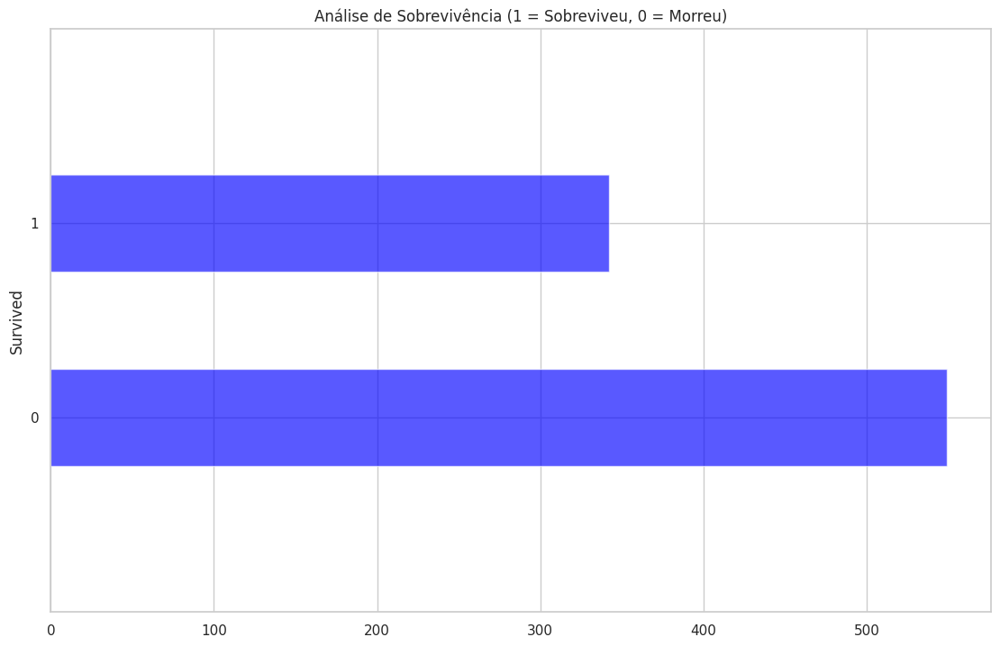

In [10]:
plt.figure(figsize=(6,4))
fig, ax = plt.subplots()
df.Survived.value_counts().plot(kind='barh', color="blue", alpha=.65)
ax.set_ylim(-1, len(df.Survived.value_counts()))
plt.title("Análise de Sobrevivência (1 = Sobreviveu, 0 = Morreu)")

(-1.0, 2.0)

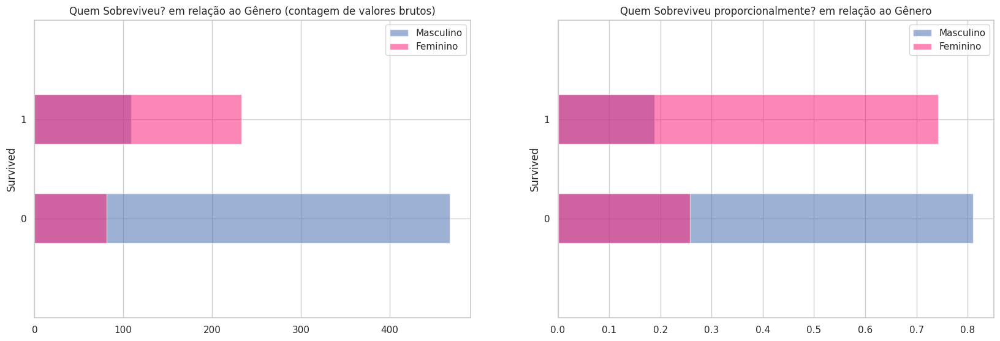

In [12]:
fig = plt.figure(figsize=(18,6))

#cria um gráfico de dois subconjuntos, masculino e feminino, da variável de sobreviventes.
#Depois disso, chamamos value_counts() para que possa ser facilmente plotado como um gráfico de barras.
#'barh' é apenas um gráfico de barras horizontal
df_masculino = df.Survived[df.Sex == 'male'].value_counts().sort_index()
df_feminino = df.Survived[df.Sex == 'female'].value_counts().sort_index()

ax1 = fig.add_subplot(121)
df_masculino.plot(kind='barh',label='Masculino', alpha=0.55)
df_feminino.plot(kind='barh', color='#FA2379',label='Feminino', alpha=0.55)
plt.title("Quem Sobreviveu? em relação ao Gênero (contagem de valores brutos)"); plt.legend(loc='best')
ax1.set_ylim(-1, 2)

#ajusta o gráfico para exibir as proporções de sobrevivência por gênero
ax2 = fig.add_subplot(122)
(df_masculino/float(df_masculino.sum())).plot(kind='barh',label='Masculino', alpha=0.55)
(df_feminino/float(df_feminino.sum())).plot(kind='barh', color='#FA2379',label='Feminino', alpha=0.55)
plt.title("Quem Sobreviveu proporcionalmente? em relação ao Gênero"); plt.legend(loc='best')

ax2.set_ylim(-1, 2)

Gráfico 1: Quem Sobreviveu? (Contagem de Valores Brutos)
 Este gráfico mostra a contagem absoluta de homens e mulheres que sobreviveram e não sobreviveram. Podemos observar que, em números brutos, muito mais homens não sobreviveram em comparação com as mulheres. Ao mesmo tempo, o número de mulheres que sobreviveram é consideravelmente maior que o de homens sobreviventes. Embora houvesse mais homens a bordo, este gráfico por si só pode ser enganoso se não considerarmos as proporções.
Gráfico 2: Quem Sobreviveu Proporcionalmente?
Este gráfico normaliza os dados, mostrando a proporção de sobreviventes e não sobreviventes dentro de cada gênero. A história aqui fica muito mais clara:
Feminino: Uma grande maioria das mulheres a bordo sobreviveu (cerca de 75%).
Masculino: A grande maioria dos homens a bordo não sobreviveu (cerca de 80%).

A comparação entre os dois gráficos é poderosa. Enquanto o primeiro mostra que o maior grupo de vítimas era de homens, o segundo revela que ser mulher dava uma chance de sobrevivência drasticamente maior. Isso confirma a hipótese de que a política de "mulheres e crianças primeiro" foi um fator determinante para a sobrevivência no desastre do Titanic.

Aqui fica claro que, embora mais homens tenham morrido e sobrevivido em números absolutos, as mulheres tiveram uma taxa de sobrevivência proporcionalmente maior (~25%) do que os homens (~20%).


Será que conseguimos capturar mais estrutura usando a Pclass? Aqui vamos agrupar as classes como classe mais baixa ou qualquer uma das classes altas (classes 1 - 2). 3 é a classe mais baixa. Vamos detalhar por gênero e por classe em que estavam viajando.

Após estabelecermos que o gênero foi um fator crucial para a sobrevivência, vamos adicionar outra camada de análise: a classe social. A hipótese aqui é que o status socioeconômico também desempenhou um papel determinante, possivelmente modificando a regra de "mulheres e crianças primeiro".
O código a seguir gera quatro gráficos de barras, segmentando a população em quatro grupos distintos para uma comparação detalhada:

Mulheres de classe alta (1ª e 2ª).

Mulheres de classe baixa (3ª).

Homens de classe baixa (3ª).

Homens de classe alta (1ª e 2ª).

In [13]:
fig = plt.figure(figsize=(18,4), dpi=1600)
alpha_level = 0.65

# com base no código anterior, aqui criamos um subconjunto adicional dentro do subconjunto de gênero
# que criamos para a variável de sobreviventes. Eu sei, são muitos subconjuntos. Depois disso, chamamos
# value_counts() para que possa ser facilmente plotado como um gráfico de barras. isso é repetido para cada
# par de gênero e classe.
ax1=fig.add_subplot(141)
female_highclass = df.Survived[df.Sex == 'female'][df.Pclass != 3].value_counts()
female_highclass.plot(kind='bar', label='feminino, classe alta', color='#FA2479', alpha=alpha_level)
ax1.set_xticklabels(["Sobreviveu", "Morreu"], rotation=0)
ax1.set_xlim(-1, len(female_highclass))
plt.title("Quem Sobreviveu? em relação ao Gênero e Classe"); plt.legend(loc='best')

ax2=fig.add_subplot(142, sharey=ax1)
female_lowclass = df.Survived[df.Sex == 'female'][df.Pclass == 3].value_counts()
female_lowclass.plot(kind='bar', label='feminino, classe baixa', color='pink', alpha=alpha_level)
ax2.set_xticklabels(["Morreu","Sobreviveu"], rotation=0)
ax2.set_xlim(-1, len(female_lowclass))
plt.legend(loc='best')

ax3=fig.add_subplot(143, sharey=ax1)
male_lowclass = df.Survived[df.Sex == 'male'][df.Pclass == 3].value_counts()
male_lowclass.plot(kind='bar', label='masculino, classe baixa',color='lightblue', alpha=alpha_level)
ax3.set_xticklabels(["Morreu","Sobreviveu"], rotation=0)
ax3.set_xlim(-1, len(male_lowclass))
plt.legend(loc='best')

ax4=fig.add_subplot(144, sharey=ax1)
male_highclass = df.Survived[df.Sex == 'male'][df.Pclass != 3].value_counts()
male_highclass.plot(kind='bar', label='masculino, classe alta', alpha=alpha_level, color='steelblue')
ax4.set_xticklabels(["Morreu","Sobreviveu"], rotation=0)
ax4.set_xlim(-1, len(male_highclass))
plt.legend(loc='best')

Gráfico 1: Mulheres de Classe Alta (1ª e 2ª)
Mostra que a grande maioria das mulheres de classes mais altas sobreviveu. A barra de "Sobreviveu" é muito maior que a de "Morreu", indicando uma taxa de sobrevivência extremamente alta para este grupo.

Gráfico 2: Mulheres de Classe Baixa (3ª)
Para as mulheres da 3ª classe, a situação se inverte. Embora a chance de sobrevivência ainda fosse razoável (as barras têm tamanhos próximos), a contagem de mortes é ligeiramente superior à de sobreviventes. Comparado ao primeiro gráfico, fica claro que a classe social era um fator de grande impacto mesmo entre as mulheres.

Gráfico 3: Homens de Classe Baixa (3ª)
Este gráfico revela o cenário mais sombrio. A esmagadora maioria dos homens da 3ª classe não sobreviveu. A barra de "Morreu" é drasticamente maior, mostrando que este foi o grupo com a menor chance de salvação.

Gráfico 4: Homens de Classe Alta (1ª e 2ª)
Embora a maioria dos homens de classe alta também não tenha sobrevivido (seguindo a tendência geral masculina), a proporção de sobreviventes é visivelmente maior quando comparada à dos homens de classe baixa. Ser de uma classe social mais elevada aumentou as chances de sobrevivência de um homem, ainda que elas permanecessem baixas no geral.

Fica evidente que a regra "mulheres e crianças primeiro" foi fortemente influenciada pela classe social. Ser mulher aumentava suas chances, mas ser uma mulher de classe alta as tornava muito maiores. Da mesma forma, ser homem diminuía suas chances, mas ser um homem de classe baixa as tornava quase nulas.

Para entender os fatores que levaram à sobrevivência no desastre do Titanic, podemos construir nossa análise em etapas, partindo de uma visão geral para uma mais detalhada. O conjunto de gráficos a seguir conta essa história em três fases, revelando como a combinação de diferentes variáveis, como gênero e classe social, influenciou o destino dos passageiros.

In [14]:
fig = plt.figure(figsize=(18,12), dpi=1600)
a = 0.65
# Etapa 1
ax1 = fig.add_subplot(341)
df.Survived.value_counts().plot(kind='bar', color="blue", alpha=a)
ax1.set_xlim(-1, len(df.Survived.value_counts()))
plt.title("Etapa 1")

# Etapa 2
ax2 = fig.add_subplot(345)
df.Survived[df.Sex == 'male'].value_counts().plot(kind='bar',label='Masculino')
df.Survived[df.Sex == 'female'].value_counts().plot(kind='bar', color='#FA2379',label='Feminino')
ax2.set_xlim(-1, 2)
plt.title("Etapa 2 \nQuem Sobreviveu? em relação ao Gênero."); plt.legend(loc='best')

ax3 = fig.add_subplot(346)
(df.Survived[df.Sex == 'male'].value_counts()/float(df.Sex[df.Sex == 'male'].size)).plot(kind='bar',label='Masculino')
(df.Survived[df.Sex == 'female'].value_counts()/float(df.Sex[df.Sex == 'female'].size)).plot(kind='bar', color='#FA2379',label='Feminino')
ax3.set_xlim(-1,2)
plt.title("Quem Sobreviveu proporcionalmente?"); plt.legend(loc='best')


# Etapa 3
ax4 = fig.add_subplot(349)
female_highclass = df.Survived[df.Sex == 'female'][df.Pclass != 3].value_counts()
female_highclass.plot(kind='bar', label='feminino, classe alta', color='#FA2479', alpha=a)
ax4.set_xticklabels(["Sobreviveu", "Morreu"], rotation=0)
ax4.set_xlim(-1, len(female_highclass))
plt.title("Quem Sobreviveu? em relação ao Gênero e Classe"); plt.legend(loc='best')

ax5 = fig.add_subplot(3,4,10, sharey=ax1)
female_lowclass = df.Survived[df.Sex == 'female'][df.Pclass == 3].value_counts()
female_lowclass.plot(kind='bar', label='feminino, classe baixa', color='pink', alpha=a)
ax5.set_xticklabels(["Morreu","Sobreviveu"], rotation=0)
ax5.set_xlim(-1, len(female_lowclass))
plt.legend(loc='best')

ax6 = fig.add_subplot(3,4,11, sharey=ax1)
male_lowclass = df.Survived[df.Sex == 'male'][df.Pclass == 3].value_counts()
male_lowclass.plot(kind='bar', label='masculino, classe baixa',color='lightblue', alpha=a)
ax6.set_xticklabels(["Morreu","Sobreviveu"], rotation=0)
ax6.set_xlim(-1, len(male_lowclass))
plt.legend(loc='best')

ax7 = fig.add_subplot(3,4,12, sharey=ax1)
male_highclass = df.Survived[df.Sex == 'male'][df.Pclass != 3].value_counts()
male_highclass.plot(kind='bar', label='masculino, classe alta', alpha=a, color='steelblue')
ax7.set_xticklabels(["Morreu","Sobreviveu"], rotation=0)
ax7.set_xlim(-1, len(male_highclass))
plt.legend(loc='best')


Etapa 2: Introduzindo o Fator Gênero
- Esta etapa divide a análise por gênero.
- O primeiro gráfico da linha mostra a contagem bruta de sobreviventes por gênero. Vemos que o maior número de mortos era de homens.
- O segundo gráfico mostra a proporção, ou seja, a taxa de sobrevivência dentro de cada gênero.

A análise proporcional revela a verdadeira história. Enquanto a maioria esmagadora dos homens morreu (cerca de 80%), a grande maioria das mulheres sobreviveu (cerca de 75%). A regra "mulheres e crianças primeiro" parece ter sido um fator decisivo.

Etapa 3: Adicionando a Camada de Classe Social
- A etapa final segmenta os grupos de gênero pela classe social (dividida em "alta", para 1ª e 2ª classes, e "baixa", para a 3ª classe).

Análise: Esta visão detalhada mostra como a classe social influenciou a regra de gênero:
- Mulheres de Classe Alta: Tiveram uma taxa de sobrevivência altíssima. Quase todas sobreviveram.
- Mulheres de Classe Baixa: A sorte já não foi a mesma. Para elas, a contagem de mortes superou a de sobreviventes.
- Homens de Classe Baixa: Representam o grupo com o pior prognóstico. A taxa de mortalidade foi massiva.
- Homens de Classe Alta: Embora a maioria também tenha morrido, suas chances de sobrevivência foram consideravelmente maiores do que as dos homens da 3ª classe.

Essa abordagem em etapas nos permite construir uma compreensão clara e robusta dos dados. Partimos de um fato geral (a maioria morreu), adicionamos uma variável-chave (gênero), que revelou uma forte tendência, e, por fim, refinamos a análise com outra variável (classe), que mostrou as nuances dessa tendência.
A conclusão é que a sobrevivência no Titanic não dependeu de um único fator, mas de uma interseção entre gênero e classe social, criando uma hierarquia de chances bem definida.

## 4. Desbalanceamento das Subclasses


Vamos analisar o desbalanceamento entre as subclasses do conjunto de dados, considerando as combinações de classe (Pclass) e sobrevivência (Survived).

Um dos aspectos mais importantes na análise de dados, especialmente para tarefas de machine learning, é entender o desbalanceamento entre as variáveis. Desbalanceamento significa que as combinações de categorias entre duas ou mais variáveis não são uniformes. No nosso caso, queremos investigar se as chances de sobrevivência foram as mesmas para todas as classes sociais.

Contagem de passageiros por classe e sobrevivência:


Survived,0,1
Pclass,,
1,80,136
2,97,87
3,372,119


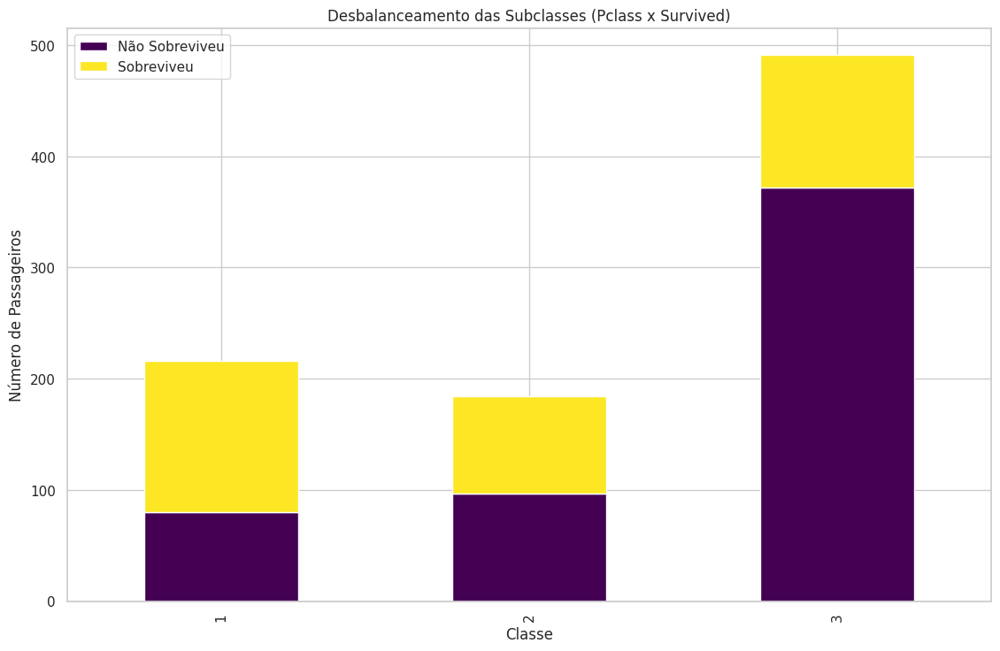

In [15]:
# Tabela de contingência entre Pclass e Survived
subclass_counts = df.groupby(['Pclass', 'Survived']).size().unstack(fill_value=0)
print("Contagem de passageiros por classe e sobrevivência:")
display(subclass_counts)

# Visualização do desbalanceamento
subclass_counts.plot(kind='bar', stacked=True, colormap='viridis')
plt.title('Desbalanceamento das Subclasses (Pclass x Survived)')
plt.xlabel('Classe')
plt.ylabel('Número de Passageiros')
plt.legend(['Não Sobreviveu', 'Sobreviveu'])
plt.show()

1. Desbalanceamento no Tamanho das Classes

A primeira coisa que notamos é que as classes não tinham o mesmo número de passageiros. O gráfico de barras mostra isso claramente:

- A barra da 3ª Classe é a mais alta, indicando que era a classe com mais passageiros.
- A 1ª Classe vem em segundo lugar.
- A 2ª Classe era a menor das três.

Isso por si só já é um desbalanceamento. Um modelo preditivo, por exemplo, terá muito mais dados para aprender sobre os passageiros da 3ª classe do que sobre os da 2ª.

2. Desbalanceamento na Taxa de Sobrevivência (O Ponto Principal)

O desbalanceamento mais crítico aqui está na relação entre a classe e a sobrevivência. Se não houvesse desbalanceamento, a proporção de sobreviventes e não sobreviventes seria a mesma para todas as classes. No entanto, os dados mostram uma realidade muito diferente:

- 1ª Classe: Olhando para a tabela, vemos 136 sobreviventes contra 80 não sobreviventes. No gráfico, a área amarela (Sobreviveu) é maior que a área roxa (Não Sobreviveu). A maioria dos passageiros desta classe sobreviveu.
- 2ª Classe: A situação é mais equilibrada, mas ainda desfavorável. Foram 87 sobreviventes e 97 não sobreviventes. As áreas no gráfico são de tamanho parecido.
- 3ª Classe: Aqui o desbalanceamento é extremo e trágico. Foram apenas 119 sobreviventes contra 372 não sobreviventes. A área roxa (Não Sobreviveu) domina completamente a barra, mostrando uma taxa de sobrevivência muito baixa.

## 5. Redução de Viés e Estratificação


Para reduzir o viés causado pelo desbalanceamento das classes e melhorar a análise, aplicamos técnicas como:

- **Estratificação dos dados**: combinando múltiplas features para criar grupos mais homogêneos.
- **Criação de novas features**: como a `Pclass_Sex`, que une informações de sobrevivência e gênero.
- **Balanceamento das classes**: utilizando técnicas como upsampling e SMOTE para equilibrar a quantidade de exemplos entre as classes.
- **Uso de modelos robustos**: como redes neurais e Random Forest, que podem lidar melhor com dados complexos e desbalanceados.

Essas abordagens permitem que o modelo aprenda de forma mais justa e generalizável, aumentando a acurácia e a capacidade de identificar padrões relevantes para a sobrevivência dos passageiros.

In [16]:
# Combinando features de entrada (Pclass e Sex)
df['Pclass_Sex'] = df['Pclass'].astype(str) + '_' + df['Sex']

# Combinando a nova feature com Embarked
df['Pclass_Sex_Embarked'] = df['Pclass_Sex'] + '_' + df['Embarked'].astype(str)

# Calcula o tamanho total da família somando irmãos/cônjuges (SibSp) e pais/filhos (Parch), mais 1 (o próprio passageiro).
# Essa feature pode indicar se grupos familiares tiveram mais ou menos chances de sobreviver.
df['FamilySize'] = df['SibSp'] + df['Parch'] + 1 

# Cria uma feature binária (0 ou 1) para identificar passageiros que viajavam sozinhos.
# Isso simplifica a informação de tamanho da família, focando no contraste entre "sozinho" e "acompanhado".
df['IsAlone'] = 0
df.loc[df['FamilySize'] == 1, 'IsAlone'] = 1

# Extrai o título de tratamento (ex: Mr., Miss., Dr.) do nome de cada passageiro usando uma expressão regular.
# O título pode ser um forte indicador de status social, idade e sexo.
df['Title'] = df['Name'].str.extract(' ([A-Za-z]+)\.', expand=False)

# Agrupa títulos raros ou sinônimos em categorias mais gerais para simplificar o modelo.
# Títulos como 'Dr', 'Rev', 'Col' são agrupados em 'Rare', e variações como 'Mlle'/'Ms' são padronizadas para 'Miss'.
df['Title'] = df['Title'].replace(['Lady', 'Countess','Capt', 'Col','Don', 'Dr', 'Major', 'Rev', 'Sir', 'Jonkheer', 'Dona'], 'Rare')
df['Title'] = df['Title'].replace('Mlle', 'Miss')
df['Title'] = df['Title'].replace('Ms', 'Miss')
df['Title'] = df['Title'].replace('Mme', 'Mrs')

print(df[['Survived', 'Pclass', 'Sex', 'Embarked', 'Pclass_Sex', 'Pclass_Sex_Embarked', 'FamilySize', 'IsAlone', 'Title']].head())

   Survived  Pclass     Sex Embarked Pclass_Sex Pclass_Sex_Embarked  \
0         0       3    male        S     3_male            3_male_S   
1         1       1  female        C   1_female          1_female_C   
2         1       3  female        S   3_female          3_female_S   
3         1       1  female        S   1_female          1_female_S   
4         0       3    male        S     3_male            3_male_S   

   FamilySize  IsAlone Title  
0           2        0    Mr  
1           2        0   Mrs  
2           1        1  Miss  
3           2        0   Mrs  
4           1        1    Mr  


<>:18: SyntaxWarning: invalid escape sequence '\.'
<>:18: SyntaxWarning: invalid escape sequence '\.'
/tmp/ipykernel_26145/353564381.py:18: SyntaxWarning: invalid escape sequence '\.'
  df['Title'] = df['Name'].str.extract(' ([A-Za-z]+)\.', expand=False)


## 6. Treinamento do Modelo


/tmp/ipykernel_26145/4073633052.py:15: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  X_train['Embarked'].fillna(embarked_mode, inplace=True)
/tmp/ipykernel_26145/4073633052.py:16: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=T

Ajustando o imputer nos dados de treino...
Transformando os dados de teste...
Pré-processamento e imputação concluídos.
Pesos de classe calculados para o treino: {0: np.float64(0.8018018018018018), 1: np.float64(1.328358208955224)}

Iniciando o treinamento do modelo com processo correto e pesos de classe...


/home/desenvolvimento/Área de trabalho/estudos/REDES_NEURAIS/.venv/lib/python3.12/site-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Treinamento concluído.

Gerando gráficos de Loss e Acurácia (Treino vs. Validação)...


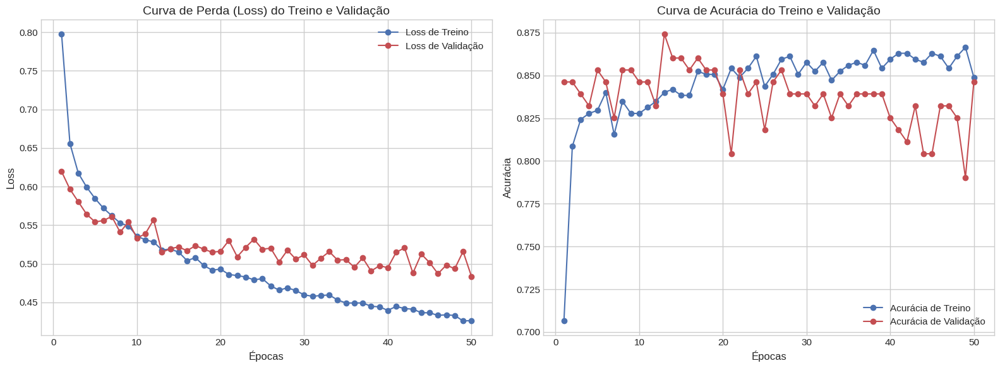


Acurácia no conjunto de teste: 81.01%
Precisão (Precision): 77.78%
Revocação (Recall): 75.68%
F1-Score: 76.71%

Relatório de Classificação:
                    precision    recall  f1-score   support

Não Sobreviveu (0)       0.83      0.85      0.84       105
    Sobreviveu (1)       0.78      0.76      0.77        74

          accuracy                           0.81       179
         macro avg       0.80      0.80      0.80       179
      weighted avg       0.81      0.81      0.81       179



In [36]:
features_para_usar = ['Pclass', 'Sex', 'Age', 'SibSp', 'Parch', 'Fare', 'Embarked', 'Pclass_Sex', 'Pclass_Sex_Embarked', 'FamilySize', 'IsAlone', 'Title']
alvo = 'Survived'

# Antes de qualquer tratamento, separamos nossos dados em dois conjuntos: um para treino (80% dos dados) e um para teste (20%).
X = df[features_para_usar]
y = df[alvo]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Pré-processamento com IterativeImputer 

categorical_cols = ['Pclass', 'Sex', 'Embarked', 'Pclass_Sex', 'Pclass_Sex_Embarked', 'FamilySize', 'IsAlone', 'Title']

# Preencher 'Embarked' com a moda do TREINO, pois IterativeImputer lida mal com strings.
embarked_mode = X_train['Embarked'].mode()[0]
X_train['Embarked'].fillna(embarked_mode, inplace=True)
X_test['Embarked'].fillna(embarked_mode, inplace=True) # Usa a moda do TREINO

# Criar Dummies (One-Hot Encoding) ANTES da imputação.
# Isso permite que o imputer use as informações das colunas categóricas para prever os valores de 'Age' e 'Fare'.
combined = pd.concat([X_train, X_test], axis=0)
combined_dummies = pd.get_dummies(combined, columns=categorical_cols, drop_first=True)

# Separar de volta em treino e teste
X_train_temp = combined_dummies.loc[X_train.index]
X_test_temp = combined_dummies.loc[X_test.index]

# Usar o IterativeImputer para preencher os valores ausentes de 'Age' e 'Fare'.
# Usamos um estimador robusto (RandomForest) para capturar relações complexas.
imputer = IterativeImputer(
    estimator=RandomForestRegressor(n_estimators=10, random_state=42),
    max_iter=10,
    random_state=42,
    initial_strategy='median',
    verbose=0 # Mude para 2 para ver o processo
)

# "Ajustamos" (fit) o imputer APENAS com os dados de TREINO.
# E então o usamos para transformar AMBOS os conjuntos (treino e teste).
# Isso evita que informações do conjunto de teste "vazem" para o treino.

print("Ajustando o imputer nos dados de treino...")
X_train_imputed_array = imputer.fit_transform(X_train_temp)
print("Transformando os dados de teste...")
X_test_imputed_array = imputer.transform(X_test_temp)

# Converter de volta para DataFrame, preservando colunas e índices
X_train_encoded = pd.DataFrame(X_train_imputed_array, columns=X_train_temp.columns, index=X_train.index)
X_test_encoded = pd.DataFrame(X_test_imputed_array, columns=X_test_temp.columns, index=X_test.index)

print("Pré-processamento e imputação concluídos.")

# Padronização de Escalas (Scaling)
# O scaler "aprende" os parâmetros (fit) apenas no treino e os aplica em ambos os conjuntos.
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train_encoded)
X_test_scaled = scaler.transform(X_test_encoded)

model = Sequential([
    Dense(64, activation='relu',
          kernel_initializer='he_normal',  # <-- Inicialização dos pesos.
          kernel_regularizer=l2(0.001),
          input_shape=(X_train_scaled.shape[1],)),
    Dense(32, activation='relu',
          kernel_initializer='he_normal',  # <-- Inicialização dos pesos.
          kernel_regularizer=l2(0.001)),
    Dense(1, activation='sigmoid')
])

model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Tratamento do Desbalanceamento de Classes
weights = compute_class_weight(class_weight='balanced',
                               classes=np.unique(y_train),
                               y=y_train)
class_weight_dict = dict(enumerate(weights))
print(f"Pesos de classe calculados para o treino: {class_weight_dict}")

print("\nIniciando o treinamento do modelo com processo correto e pesos de classe...")
history = model.fit(X_train_scaled, y_train,
                    epochs=50,
                    batch_size=16,
                    validation_split=0.2,     # <-- Aqui é criado o conjunto de validação.
                    class_weight=class_weight_dict,
                    verbose=0)
print("Treinamento concluído.")

print("\nGerando gráficos de Loss e Acurácia (Treino vs. Validação)...")

# Extrai o histórico do treinamento
history_dict = history.history

# Pega as métricas de loss e acurácia
loss = history_dict['loss']
val_loss = history_dict['val_loss']
accuracy = history_dict['accuracy']
val_accuracy = history_dict['val_accuracy']

# Cria um array com o número de épocas
epochs = range(1, len(loss) + 1)

# Cria a figura e os eixos para os dois gráficos
plt.style.use('seaborn-v0_8-whitegrid') # Define um estilo visual agradável
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))

# --- Gráfico da Perda (Loss) ---
ax1.plot(epochs, loss, 'bo-', label='Loss de Treino')
ax1.plot(epochs, val_loss, 'ro-', label='Loss de Validação')
ax1.set_title('Curva de Perda (Loss) do Treino e Validação', fontsize=14)
ax1.set_xlabel('Épocas', fontsize=12)
ax1.set_ylabel('Loss', fontsize=12)
ax1.legend()

# --- Gráfico da Acurácia (Accuracy) ---
ax2.plot(epochs, accuracy, 'bo-', label='Acurácia de Treino')
ax2.plot(epochs, val_accuracy, 'ro-', label='Acurácia de Validação')
ax2.set_title('Curva de Acurácia do Treino e Validação', fontsize=14)
ax2.set_xlabel('Épocas', fontsize=12)
ax2.set_ylabel('Acurácia', fontsize=12)
ax2.legend()

# Ajusta o layout e exibe os gráficos
plt.tight_layout()
plt.show()

loss, acc = model.evaluate(X_test_scaled, y_test, verbose=0)
print(f'\nAcurácia no conjunto de teste: {acc:.2%}')

# O modelo retorna probabilidades, então convertemos para 0 ou 1 com base em um limiar de 0.5
y_pred_prob = model.predict(X_test_scaled, verbose=0)
y_pred = (y_pred_prob > 0.5).astype(int)

precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)

print(f'Precisão (Precision): {precision:.2%}')
print(f'Revocação (Recall): {recall:.2%}')
print(f'F1-Score: {f1:.2%}')

print("\nRelatório de Classificação:")
print(classification_report(y_test, y_pred, target_names=['Não Sobreviveu (0)', 'Sobreviveu (1)']))


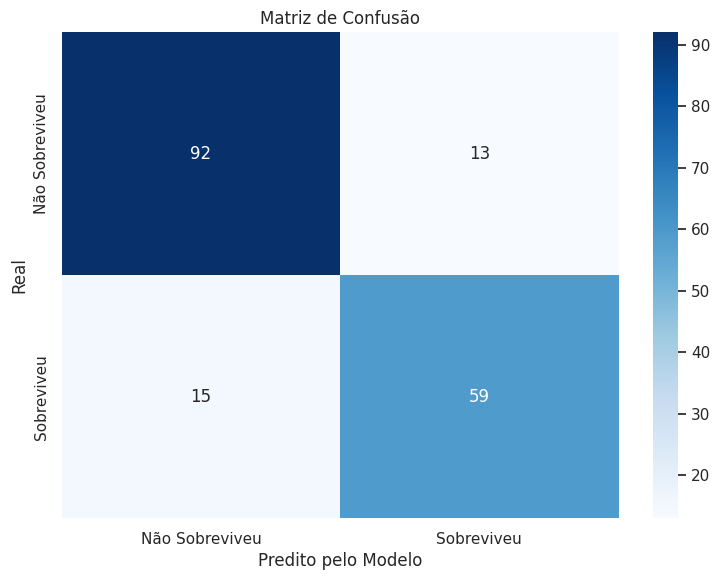

In [139]:
# Gerar a matriz de confusão
cm = confusion_matrix(y_test, y_pred)

# Visualizar a matriz de confusão
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=['Não Sobreviveu', 'Sobreviveu'],
            yticklabels=['Não Sobreviveu', 'Sobreviveu'])
plt.xlabel('Predito pelo Modelo')
plt.ylabel('Real')
plt.title('Matriz de Confusão')
plt.show()

## Usando o sample_weight

Iniciando o pré-processamento com IterativeImputer...
Ajustando o imputer nos dados de treino...


/tmp/ipykernel_26145/3695698901.py:15: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  X_train['Embarked'].fillna(embarked_mode, inplace=True)
/tmp/ipykernel_26145/3695698901.py:16: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=T

Transformando os dados de teste...
Pré-processamento e imputação concluídos.
Pesos por classe: {0: np.float64(0.8018018018018018), 1: np.float64(1.328358208955224)}
Array 'sample_weight' criado com 712 elementos.
Primeiros 5 pesos de amostra: [0.8018018 0.8018018 0.8018018 0.8018018 0.8018018]

Iniciando o treinamento do modelo com processo correto e pesos de classe...


/home/desenvolvimento/Área de trabalho/estudos/REDES_NEURAIS/.venv/lib/python3.12/site-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Treinamento concluído.

Gerando gráficos de Loss e Acurácia (Treino vs. Validação)...


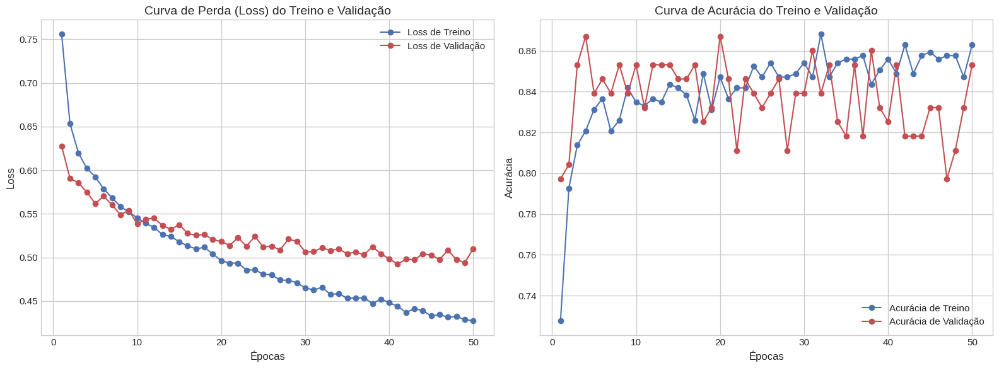


Acurácia no conjunto de teste: 81.01%
Precisão (Precision): 78.57%
Revocação (Recall): 74.32%
F1-Score: 76.39%

Relatório de Classificação:
                    precision    recall  f1-score   support

Não Sobreviveu (0)       0.83      0.86      0.84       105
    Sobreviveu (1)       0.79      0.74      0.76        74

          accuracy                           0.81       179
         macro avg       0.81      0.80      0.80       179
      weighted avg       0.81      0.81      0.81       179



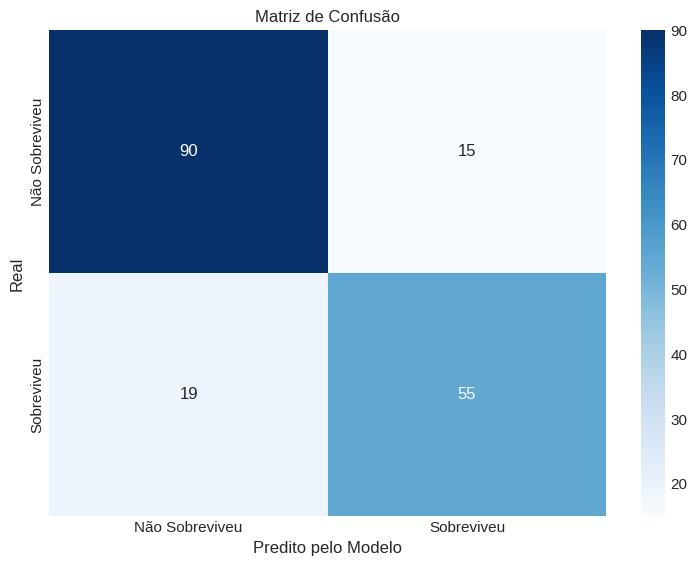

In [47]:
features_para_usar = ['Pclass', 'Sex', 'Age', 'SibSp', 'Parch', 'Fare', 'Embarked', 'Pclass_Sex', 'Pclass_Sex_Embarked', 'FamilySize', 'IsAlone', 'Title']
alvo = 'Survived'

# Antes de qualquer tratamento, separamos nossos dados em dois conjuntos: um para treino (80% dos dados) e um para teste (20%).
X = df[features_para_usar]
y = df[alvo]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

print("Iniciando o pré-processamento com IterativeImputer...")

categorical_cols = ['Pclass', 'Sex', 'Embarked', 'Pclass_Sex', 'Pclass_Sex_Embarked', 'FamilySize', 'IsAlone', 'Title']

# Preencher 'Embarked' com a moda do TREINO, pois IterativeImputer lida mal com strings.
embarked_mode = X_train['Embarked'].mode()[0]
X_train['Embarked'].fillna(embarked_mode, inplace=True)
X_test['Embarked'].fillna(embarked_mode, inplace=True) # Usa a moda do TREINO

# Criar Dummies (One-Hot Encoding) ANTES da imputação.
# Isso permite que o imputer use as informações das colunas categóricas para prever os valores de 'Age' e 'Fare'.
combined = pd.concat([X_train, X_test], axis=0)
combined_dummies = pd.get_dummies(combined, columns=categorical_cols, drop_first=True)

# Separar de volta em treino e teste
X_train_temp = combined_dummies.loc[X_train.index]
X_test_temp = combined_dummies.loc[X_test.index]

# Usar o IterativeImputer para preencher os valores ausentes de 'Age' e 'Fare'.
# Usamos um estimador robusto (RandomForest) para capturar relações complexas.
imputer = IterativeImputer(
    estimator=RandomForestRegressor(n_estimators=10, random_state=42),
    max_iter=10,
    random_state=42,
    initial_strategy='median',
    verbose=0 # Mude para 2 para ver o processo
)

# "Ajustamos" (fit) o imputer APENAS com os dados de TREINO.
# E então o usamos para transformar AMBOS os conjuntos (treino e teste).
# Isso evita que informações do conjunto de teste "vazem" para o treino.

print("Ajustando o imputer nos dados de treino...")
X_train_imputed_array = imputer.fit_transform(X_train_temp)
print("Transformando os dados de teste...")
X_test_imputed_array = imputer.transform(X_test_temp)

# Converter de volta para DataFrame, preservando colunas e índices
X_train_encoded = pd.DataFrame(X_train_imputed_array, columns=X_train_temp.columns, index=X_train.index)
X_test_encoded = pd.DataFrame(X_test_imputed_array, columns=X_test_temp.columns, index=X_test.index)

print("Pré-processamento e imputação concluídos.")


# Padronização de Escalas (Scaling)
# O scaler "aprende" os parâmetros (fit) apenas no treino e os aplica em ambos os conjuntos.
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train_encoded)
X_test_scaled = scaler.transform(X_test_encoded)

model = Sequential([
    Dense(64, activation='relu',
          kernel_initializer='he_normal',
          kernel_regularizer=l2(0.001),
          input_shape=(X_train_scaled.shape[1],)),
    Dense(32, activation='relu',
          kernel_initializer='he_normal',
          kernel_regularizer=l2(0.001)),
    Dense(1, activation='sigmoid')
])

model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# 1. Calcule os pesos por classe, como antes.
class_weights = compute_class_weight(class_weight='balanced',
                                     classes=np.unique(y_train),
                                     y=y_train)
class_weight_dict = dict(enumerate(class_weights))
print(f"Pesos por classe: {class_weight_dict}")

# 2. Crie o array sample_weight mapeando os pesos de classe para cada amostra em y_train.
# y_train é uma Série pandas, então podemos usar .map() diretamente.
sample_weights = y_train.map(class_weight_dict).to_numpy()

print(f"Array 'sample_weight' criado com {len(sample_weights)} elementos.")
# Exemplo dos primeiros 5 pesos:
print(f"Primeiros 5 pesos de amostra: {sample_weights[:5]}")

print("\nIniciando o treinamento do modelo com processo correto e pesos de classe...")
history = model.fit(X_train_scaled, y_train,
                    epochs=50,
                    batch_size=16,
                    validation_split=0.2, 
                    sample_weight=sample_weights, 
                    verbose=0)
print("Treinamento concluído.")

print("\nGerando gráficos de Loss e Acurácia (Treino vs. Validação)...")

# Extrai o histórico do treinamento
history_dict = history.history

# Pega as métricas de loss e acurácia
loss = history_dict['loss']
val_loss = history_dict['val_loss']
accuracy = history_dict['accuracy']
val_accuracy = history_dict['val_accuracy']

# Cria um array com o número de épocas
epochs = range(1, len(loss) + 1)

# Cria a figura e os eixos para os dois gráficos
plt.style.use('seaborn-v0_8-whitegrid') # Define um estilo visual agradável
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))

# --- Gráfico da Perda (Loss) ---
ax1.plot(epochs, loss, 'bo-', label='Loss de Treino')
ax1.plot(epochs, val_loss, 'ro-', label='Loss de Validação')
ax1.set_title('Curva de Perda (Loss) do Treino e Validação', fontsize=14)
ax1.set_xlabel('Épocas', fontsize=12)
ax1.set_ylabel('Loss', fontsize=12)
ax1.legend()

# --- Gráfico da Acurácia (Accuracy) ---
ax2.plot(epochs, accuracy, 'bo-', label='Acurácia de Treino')
ax2.plot(epochs, val_accuracy, 'ro-', label='Acurácia de Validação')
ax2.set_title('Curva de Acurácia do Treino e Validação', fontsize=14)
ax2.set_xlabel('Épocas', fontsize=12)
ax2.set_ylabel('Acurácia', fontsize=12)
ax2.legend()

# Ajusta o layout e exibe os gráficos
plt.tight_layout()
plt.show()

loss, acc = model.evaluate(X_test_scaled, y_test, verbose=0)
print(f'\nAcurácia no conjunto de teste: {acc:.2%}')

# O modelo retorna probabilidades, então convertemos para 0 ou 1 com base em um limiar de 0.5
y_pred_prob = model.predict(X_test_scaled, verbose=0)
y_pred = (y_pred_prob > 0.5).astype(int)

precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)

print(f'Precisão (Precision): {precision:.2%}')
print(f'Revocação (Recall): {recall:.2%}')
print(f'F1-Score: {f1:.2%}')

print("\nRelatório de Classificação:")
print(classification_report(y_test, y_pred, target_names=['Não Sobreviveu (0)', 'Sobreviveu (1)']))

# Gerar a matriz de confusão
cm = confusion_matrix(y_test, y_pred)

# Visualizar a matriz de confusão
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=['Não Sobreviveu', 'Sobreviveu'],
            yticklabels=['Não Sobreviveu', 'Sobreviveu'])
plt.xlabel('Predito pelo Modelo')
plt.ylabel('Real')
plt.title('Matriz de Confusão')
plt.show()

In [140]:
from fairlearn.metrics import MetricFrame, selection_rate, equalized_odds_difference
from sklearn.metrics import accuracy_score, recall_score

# Recupere a coluna 'Sex' original do conjunto de teste para a análise de fairness
A_test = X_test['Sex']

# Dicionário de métricas que queremos analisar
metrics = {
    'accuracy': accuracy_score,
    'recall': recall_score,
    'selection_rate': selection_rate # % de cada grupo classificada como 'Sobreviveu'
}

# Crie o MetricFrame
grouped_on_sex = MetricFrame(metrics=metrics,
                             y_true=y_test,
                             y_pred=y_pred,
                             sensitive_features=A_test)

# Imprima as métricas por grupo e a diferença entre eles
print("Métricas do Modelo Original por Gênero:")
print(grouped_on_sex.by_group)
print("\nDiferenças entre os grupos:")
print(grouped_on_sex.difference())

Métricas do Modelo Original por Gênero:
        accuracy    recall  selection_rate
Sex                                       
female  0.811594  0.942308        0.855072
male    0.863636  0.454545        0.118182

Diferenças entre os grupos:
accuracy          0.052042
recall            0.487762
selection_rate    0.736891
dtype: float64



O modelo cometeu 101 erros de um total de 712 passageiros de treino.

Amostra dos passageiros do TREINO classificados incorretamente:
     Pclass     Sex   Age  SibSp  Parch     Fare Embarked Pclass_Sex  \
81        3    male  29.0      0      0   9.5000        S     3_male   
762       3    male  20.0      0      0   7.2292        C     3_male   
199       2  female  24.0      0      0  13.0000        S   2_female   
2         3  female  26.0      0      0   7.9250        S   3_female   
404       3  female  20.0      0      0   8.6625        S   3_female   

    Pclass_Sex_Embarked  FamilySize  IsAlone Title  Real_Survived  \
81             3_male_S           1        1    Mr              1   
762            3_male_C           1        1    Mr              1   
199          2_female_S           1        1  Miss              0   
2            3_female_S           1        1  Miss              1   
404          3_female_S           1        1  Miss              0   

     Predicted_Su

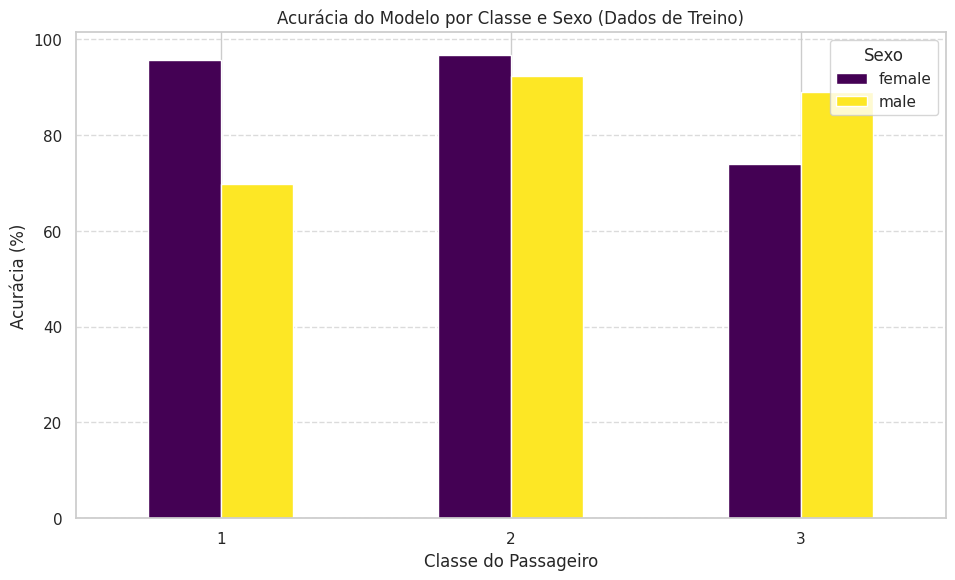

In [141]:
import seaborn as sns
import matplotlib.pyplot as plt

# O modelo já foi treinado, agora vamos usá-lo para prever nos dados de treino.
y_pred_prob_train = model.predict(X_train_scaled, verbose=0)
y_pred_train = (y_pred_prob_train > 0.5).astype(int).flatten() # Usamos .flatten() para garantir o formato correto

# Juntando os dados de treino com as previsões para análise
X_train_analise = X_train.copy()
X_train_analise['Real_Survived'] = y_train
X_train_analise['Predicted_Survived'] = y_pred_train

# Criando o DataFrame apenas com os erros cometidos no treino
df_erros_treino = X_train_analise[X_train_analise['Real_Survived'] != X_train_analise['Predicted_Survived']]

print(f"\nO modelo cometeu {len(df_erros_treino)} erros de um total de {len(X_train_analise)} passageiros de treino.")
print("\nAmostra dos passageiros do TREINO classificados incorretamente:")
print(df_erros_treino.head())

# Adicionando uma coluna para verificar se a previsão foi correta (1) ou não (0)
X_train_analise['Acertou'] = (X_train_analise['Real_Survived'] == X_train_analise['Predicted_Survived']).astype(int)

# Calculando a acurácia por Sexo e Classe nos dados de treino
acuracia_por_grupo_treino = X_train_analise.groupby(['Pclass', 'Sex'])['Acertou'].mean() * 100

print("\n--- Acurácia por Grupo (DADOS DE TREINO) ---")
print(acuracia_por_grupo_treino.round(2).unstack())

# Plotando a acurácia por grupo do treino
plt.figure(figsize=(10, 6))
acuracia_por_grupo_treino.unstack().plot(kind='bar', ax=plt.gca(), colormap='viridis')
plt.title('Acurácia do Modelo por Classe e Sexo (Dados de Treino)')
plt.xlabel('Classe do Passageiro')
plt.ylabel('Acurácia (%)')
plt.xticks(rotation=0)
plt.legend(title='Sexo')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

In [142]:
import seaborn as sns
import matplotlib.pyplot as plt

# Juntando os dados de teste com as previsões para análise
X_test_analise = X_test.copy()
X_test_analise['Real_Survived'] = y_test
X_test_analise['Predicted_Survived'] = y_pred

# Criando o DataFrame apenas com os erros
# .flatten() é usado para garantir que as dimensões sejam compatíveis
df_erros = X_test_analise[X_test_analise['Real_Survived'] != X_test_analise['Predicted_Survived']]

print(f"\nO modelo cometeu {len(df_erros)} erros de um total de {len(X_test_analise)} passageiros de teste.")
print("\nAmostra dos passageiros classificados incorretamente:")
print(df_erros.head())


O modelo cometeu 28 erros de um total de 179 passageiros de teste.

Amostra dos passageiros classificados incorretamente:
     Pclass     Sex   Age  SibSp  Parch     Fare Embarked Pclass_Sex  \
39        3  female  14.0      1      0  11.2417        C   3_female   
621       1    male  42.0      1      0  52.5542        S     1_male   
447       1    male  34.0      0      0  26.5500        S     1_male   
192       3  female  19.0      1      0   7.8542        S   3_female   
673       2    male  31.0      0      0  13.0000        S     2_male   

    Pclass_Sex_Embarked  FamilySize  IsAlone Title  Real_Survived  \
39           3_female_C           2        0  Miss              1   
621            1_male_S           2        0    Mr              1   
447            1_male_S           1        1    Mr              1   
192          3_female_S           2        0  Miss              1   
673            2_male_S           1        1    Mr              1   

     Predicted_Survived  
39 


O modelo cometeu 101 erros de um total de 712 passageiros de treino.

Amostra dos passageiros do TREINO classificados incorretamente:
     Pclass     Sex   Age  SibSp  Parch     Fare Embarked Pclass_Sex  \
81        3    male  29.0      0      0   9.5000        S     3_male   
762       3    male  20.0      0      0   7.2292        C     3_male   
199       2  female  24.0      0      0  13.0000        S   2_female   
2         3  female  26.0      0      0   7.9250        S   3_female   
404       3  female  20.0      0      0   8.6625        S   3_female   

    Pclass_Sex_Embarked  FamilySize  IsAlone Title  Real_Survived  \
81             3_male_S           1        1    Mr              1   
762            3_male_C           1        1    Mr              1   
199          2_female_S           1        1  Miss              0   
2            3_female_S           1        1  Miss              1   
404          3_female_S           1        1  Miss              0   

     Predicted_Su

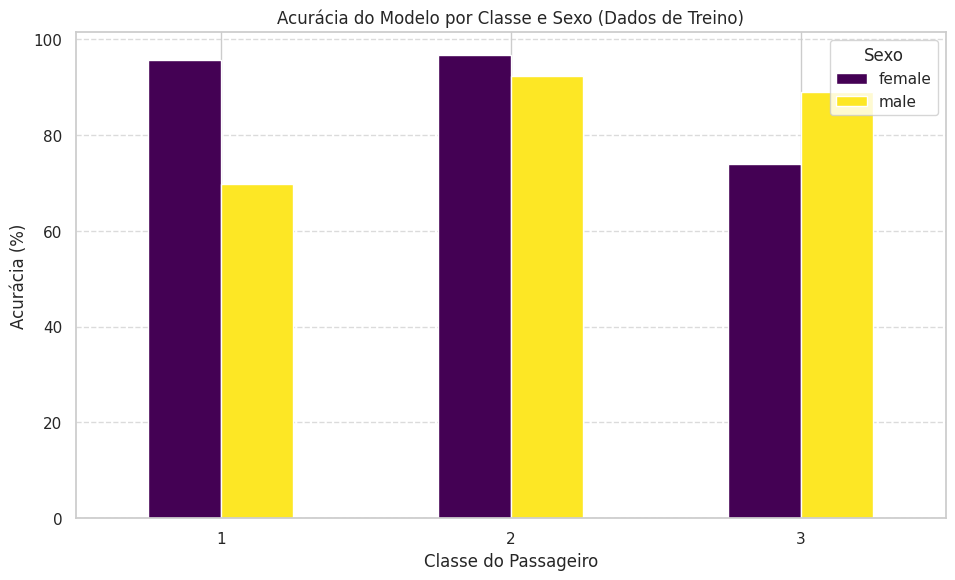

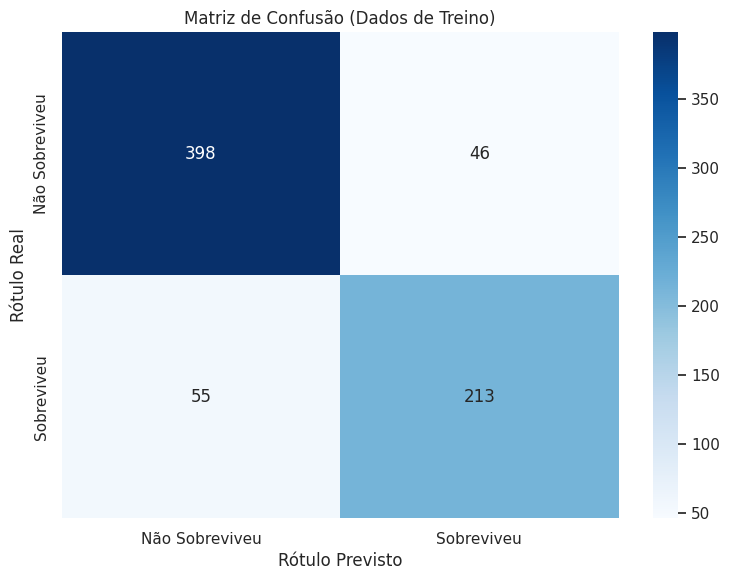

In [148]:
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix


# O modelo já foi treinado, agora vamos usá-lo para prever nos dados de treino.
y_pred_prob_train = model.predict(X_train_scaled, verbose=0)
y_pred_train = (y_pred_prob_train > 0.5).astype(int).flatten() # Usamos .flatten() para garantir o formato correto

# Juntando os dados de treino com as previsões para análise
X_train_analise = X_train.copy()
X_train_analise['Real_Survived'] = y_train
X_train_analise['Predicted_Survived'] = y_pred_train

# Criando o DataFrame apenas com os erros cometidos no treino
df_erros_treino = X_train_analise[X_train_analise['Real_Survived'] != X_train_analise['Predicted_Survived']]

print(f"\nO modelo cometeu {len(df_erros_treino)} erros de um total de {len(X_train_analise)} passageiros de treino.")
print("\nAmostra dos passageiros do TREINO classificados incorretamente:")
print(df_erros_treino.head())

# Adicionando uma coluna para verificar se a previsão foi correta (1) ou não (0)
X_train_analise['Acertou'] = (X_train_analise['Real_Survived'] == X_train_analise['Predicted_Survived']).astype(int)

# Calculando a acurácia por Sexo e Classe nos dados de treino
acuracia_por_grupo_treino = X_train_analise.groupby(['Pclass', 'Sex'])['Acertou'].mean() * 100

print("\n--- Acurácia por Grupo (DADOS DE TREINO) ---")
print(acuracia_por_grupo_treino.round(2).unstack())

# Plotando a acurácia por grupo do treino
plt.figure(figsize=(10, 6))
acuracia_por_grupo_treino.unstack().plot(kind='bar', ax=plt.gca(), colormap='viridis')
plt.title('Acurácia do Modelo por Classe e Sexo (Dados de Treino)')
plt.xlabel('Classe do Passageiro')
plt.ylabel('Acurácia (%)')
plt.xticks(rotation=0)
plt.legend(title='Sexo')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

# Calculando a matriz de confusão
cm_train = confusion_matrix(y_train, y_pred_train)

# Plotando a matriz de confusão com Seaborn
plt.figure(figsize=(8, 6))
sns.heatmap(cm_train, annot=True, fmt='d', cmap='Blues',
            xticklabels=['Não Sobreviveu', 'Sobreviveu'],
            yticklabels=['Não Sobreviveu', 'Sobreviveu'])
plt.title('Matriz de Confusão (Dados de Treino)')
plt.xlabel('Rótulo Previsto')
plt.ylabel('Rótulo Real')
plt.show()

## 7. Validação Durante o Treinamento


Esta tabela detalhada nos mostra onde o modelo está acertando e errando em um nível mais granular.

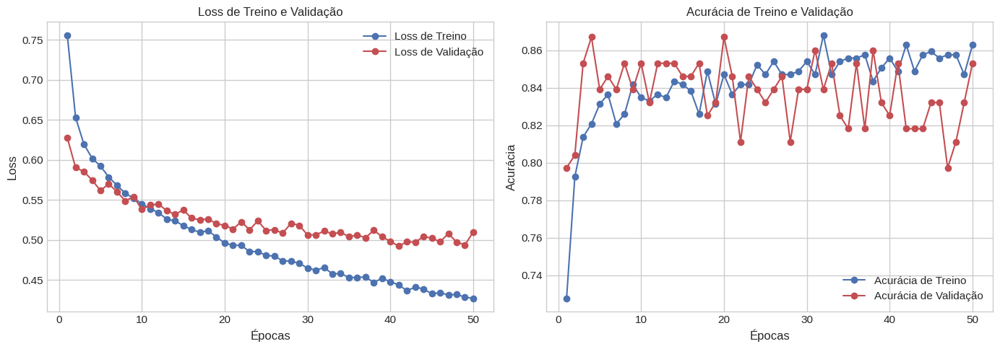

In [48]:
loss = history.history['loss']
val_loss = history.history['val_loss']
accuracy = history.history['accuracy']
val_accuracy = history.history['val_accuracy']
epochs = range(1, len(loss) + 1)

# Cria a figura para os gráficos
plt.figure(figsize=(14, 5))

# Gráfico de Loss
plt.subplot(1, 2, 1)
plt.plot(epochs, loss, 'bo-', label='Loss de Treino')
plt.plot(epochs, val_loss, 'ro-', label='Loss de Validação')
plt.title('Loss de Treino e Validação')
plt.xlabel('Épocas')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)

# Gráfico de Acurácia
plt.subplot(1, 2, 2)
plt.plot(epochs, accuracy, 'bo-', label='Acurácia de Treino')
plt.plot(epochs, val_accuracy, 'ro-', label='Acurácia de Validação')
plt.title('Acurácia de Treino e Validação')
plt.xlabel('Épocas')
plt.ylabel('Acurácia')
plt.legend()
plt.grid(True)

# Exibe os gráficos
plt.tight_layout()
plt.show()

O que foi feito? Criamos novas colunas (features) combinando informações existentes. Por exemplo, Pclass_Sex une a classe do passageiro com seu sexo (ex: "1_female", "3_male").

Um modelo de Machine Learning aprende com os dados que fornecemos. Às vezes, as colunas originais não contam a história completa. A hipótese aqui é que a combinação de features pode ser mais poderosa que as features isoladas. Por exemplo, uma mulher na primeira classe (1_female) tinha uma probabilidade de sobrevivência muito diferente de um homem na terceira classe (3_male). Essas novas features capturam essa "interação" diretamente, facilitando o aprendizado do modelo.

### 9.1 Análise de Erros no Conjunto de Treino




In [144]:
# Reconstrução do DataFrame com previsões e rótulos verdadeiros
X_test_result = X_test.copy()
X_test_result['Real'] = y_test.values
X_test_result['Previsto'] = y_pred.flatten()
X_test_result['Probabilidade'] = y_pred_prob.flatten()

# Precisamos da coluna original 'Sex' para a análise
X_test_result['Sexo_original'] = df.loc[X_test_result.index, 'Sex']

In [145]:
# Filtra apenas os exemplos em que o modelo errou
erros = X_test_result[X_test_result['Real'] != X_test_result['Previsto']]
print(f"Total de erros: {len(erros)}")


Total de erros: 28


Esse número indica que em 28 dos 179 exemplos de teste, o modelo fez previsões incorretas — ou seja, o valor previsto (Previsto) foi diferente do valor real (Real).

In [146]:
# Conta os erros por sexo
erros_por_sexo = erros['Sexo_original'].value_counts()
print("\nErros por sexo:")
print(erros_por_sexo)



Erros por sexo:
Sexo_original
male      15
female    13
Name: count, dtype: int64


Entre os 28 erros cometidos, 15 envolvem homens e 13 envolvem mulheres

In [147]:
falsos_negativos = erros[(erros['Real'] == 1) & (erros['Previsto'] == 0)]
fn_por_sexo = falsos_negativos['Sexo_original'].value_counts()
print("\nFalsos negativos (sobreviveu, mas modelo disse que morreu):")
print(fn_por_sexo)



Falsos negativos (sobreviveu, mas modelo disse que morreu):
Sexo_original
male      12
female     3
Name: count, dtype: int64


Pode-se analisar que o modelo falha principalmente ao prever que homens morreriam, quando na verdade sobreviveram.



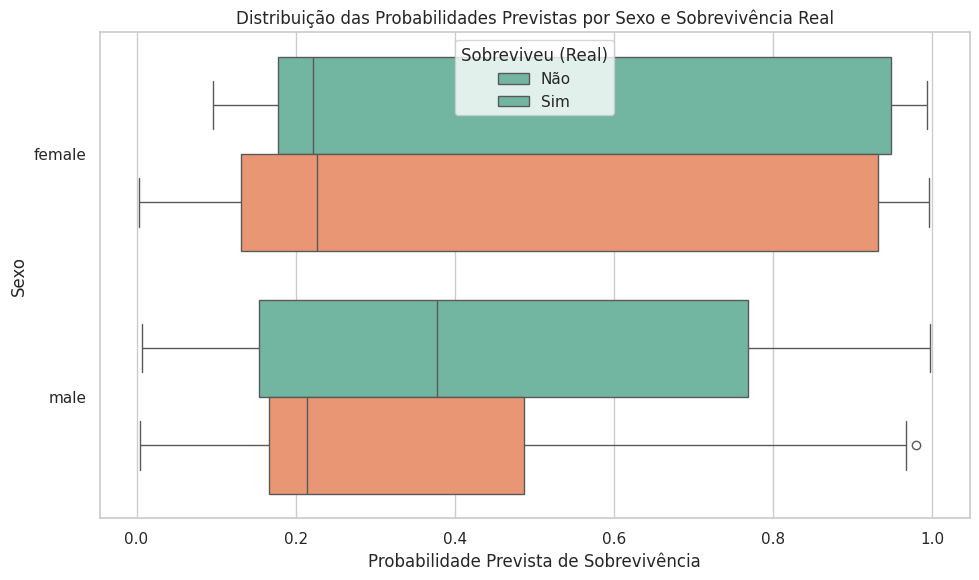

In [22]:
plt.figure(figsize=(10, 6))

sns.boxplot(data=X_test_result, y='Sexo_original', x='Probabilidade', hue='Real',
            palette='Set2', orient='h')

plt.title('Distribuição das Probabilidades Previstas por Sexo e Sobrevivência Real')
plt.ylabel('Sexo')
plt.xlabel('Probabilidade Prevista de Sobrevivência')
plt.legend(title='Sobreviveu (Real)', labels=['Não', 'Sim'])
plt.show()

Esse boxplot mostra como o modelo distribuiu as probabilidades previstas de sobrevivência para cada sexo (homem e mulher) e para cada resultado real (sobreviveu ou não).

Métricas por grupo (sexo):
        Accuracy  True Positive Rate  False Positive Rate  Selection Rate
Sex                                                                      
female  0.811594            0.942308             0.588235        0.855072
male    0.863636            0.454545             0.034091        0.118182

Disparidade absoluta entre grupos (máxima diferença):
Accuracy               0.052042
True Positive Rate     0.487762
False Positive Rate    0.554144
Selection Rate         0.736891
dtype: float64


<Figure size 1000x600 with 0 Axes>

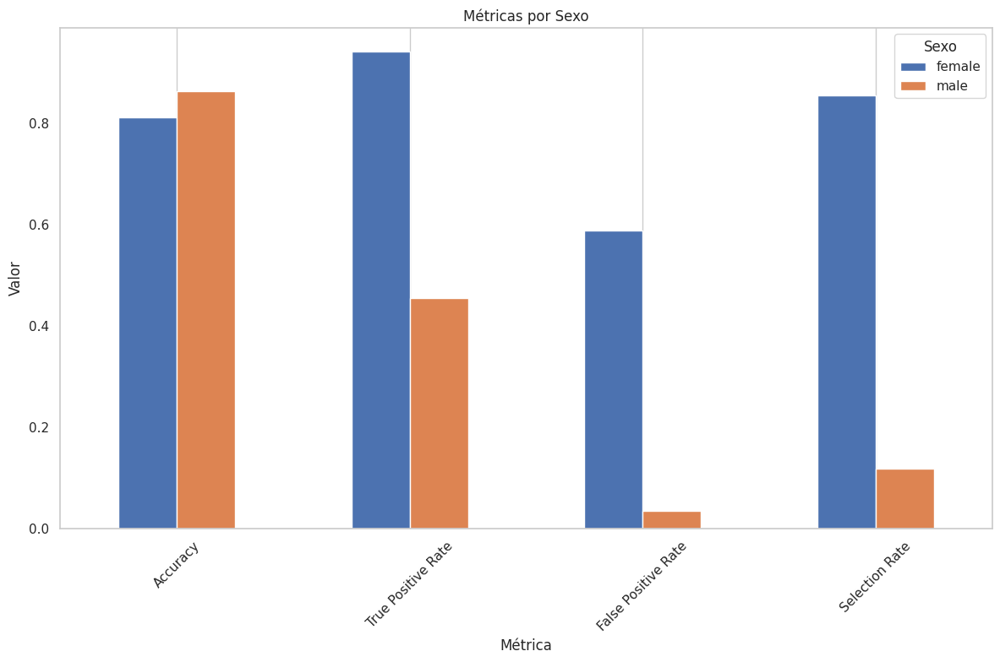


Matriz de confusão para sexo = male:
        Predito 0  Predito 1
Real 0         85          3
Real 1         12         10

Matriz de confusão para sexo = female:
        Predito 0  Predito 1
Real 0          7         10
Real 1          3         49


In [149]:
from fairlearn.metrics import (
    MetricFrame,
    false_positive_rate,
    true_positive_rate,
    selection_rate,
)
from sklearn.metrics import accuracy_score, confusion_matrix

assert 'Sex' in X_test.columns, "'Sex' precisa estar presente no X_test."

# Cópia do conjunto de teste para análise
X_test_analysis = X_test.copy()
X_test_analysis['y_true'] = y_test
X_test_analysis['y_pred'] = y_pred

sensitive_feature = X_test_analysis['Sex']

metrics = {
    'Accuracy': accuracy_score,
    'True Positive Rate': true_positive_rate,
    'False Positive Rate': false_positive_rate,
    'Selection Rate': selection_rate,
}

# Avaliação por grupo usando Fairlearn
metric_frame = MetricFrame(
    metrics=metrics,
    y_true=y_test,
    y_pred=y_pred,
    sensitive_features=sensitive_feature
)

# Exibe métricas por grupo
print("Métricas por grupo (sexo):")
print(metric_frame.by_group)

# Exibe disparidade absoluta entre grupos
disparities = metric_frame.difference(method='between_groups')
print("\nDisparidade absoluta entre grupos (máxima diferença):")
print(disparities)

# Converte métricas para DataFrame e transpõe
metrics_df = metric_frame.by_group.T
plt.figure(figsize=(10, 6))
metrics_df.plot(kind='bar')
plt.title('Métricas por Sexo')
plt.ylabel('Valor')
plt.xlabel('Métrica')
plt.xticks(rotation=45)
plt.grid(axis='y')
plt.legend(title='Sexo')
plt.tight_layout()
plt.show()


# Confusão por sexo
for sex in ['male', 'female']:
    y_true_sex = y_test[sensitive_feature == sex]
    y_pred_sex = y_pred[sensitive_feature == sex]
    cm = confusion_matrix(y_true_sex, y_pred_sex)

    print(f"\nMatriz de confusão para sexo = {sex}:")
    print(pd.DataFrame(cm, columns=['Predito 0', 'Predito 1'], index=['Real 0', 'Real 1']))


### 9.2 Análise de Erros no Conjunto de Validação


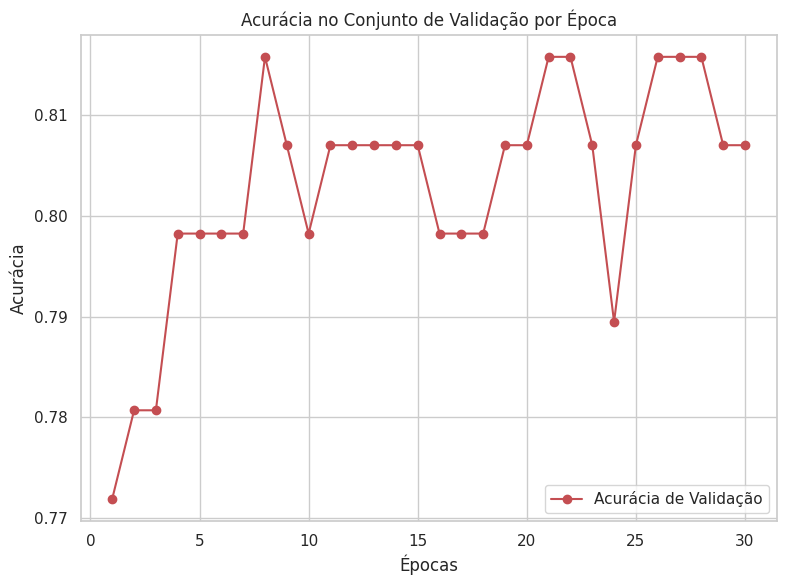


Acurácia de Validação por Época:
Época 1: 77.19%
Época 2: 78.07%
Época 3: 78.07%
Época 4: 79.82%
Época 5: 79.82%
Época 6: 79.82%
Época 7: 79.82%
Época 8: 81.58%
Época 9: 80.70%
Época 10: 79.82%
Época 11: 80.70%
Época 12: 80.70%
Época 13: 80.70%
Época 14: 80.70%
Época 15: 80.70%
Época 16: 79.82%
Época 17: 79.82%
Época 18: 79.82%
Época 19: 80.70%
Época 20: 80.70%
Época 21: 81.58%
Época 22: 81.58%
Época 23: 80.70%
Época 24: 78.95%
Época 25: 80.70%
Época 26: 81.58%
Época 27: 81.58%
Época 28: 81.58%
Época 29: 80.70%
Época 30: 80.70%


In [24]:
val_accuracy = history.history['val_accuracy']
epochs = range(1, len(val_accuracy) + 1)

plt.figure(figsize=(8, 6))
plt.plot(epochs, val_accuracy, 'ro-', label='Acurácia de Validação')
plt.title('Acurácia no Conjunto de Validação por Época')
plt.xlabel('Épocas')
plt.ylabel('Acurácia')
plt.legend()
plt.grid(True)
plt.show()

print("\nAcurácia de Validação por Época:")
for epoch, acc in zip(epochs, val_accuracy):
  print(f"Época {epoch}: {acc:.2%}")


### 9.3 Comparação da Análise de Erro do Treino e da Validação

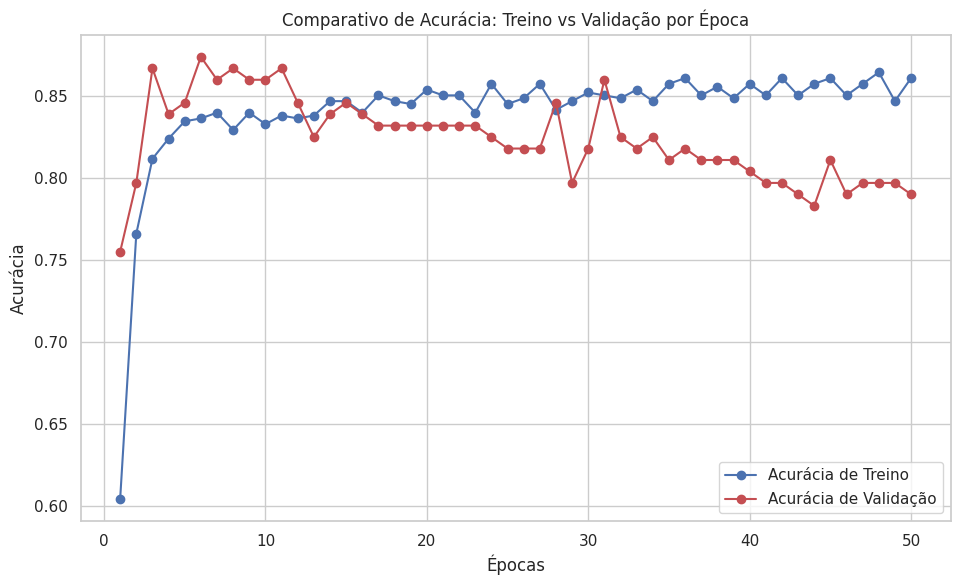

In [150]:
# Comparativo de Métricas de Treino vs Validação ao longo das Épocas
accuracy = history.history['accuracy']
val_accuracy = history.history['val_accuracy']

# Cria o eixo das épocas
epochs = range(1, len(accuracy) + 1)

# Cria a figura e o eixo para o gráfico
plt.figure(figsize=(10, 6))

# Plota a acurácia de treino
plt.plot(epochs, accuracy, 'bo-', label='Acurácia de Treino')

# Plota a acurácia de validação
plt.plot(epochs, val_accuracy, 'ro-', label='Acurácia de Validação')

# Adiciona título e rótulos
plt.title('Comparativo de Acurácia: Treino vs Validação por Época')
plt.xlabel('Épocas')
plt.ylabel('Acurácia')
plt.legend() # Mostra a legenda com os rótulos

# Adiciona grade para melhor leitura
plt.grid(True)

# Exibe o gráfico
plt.show()

### 9.4 Análise de Erros no Conjunto de Teste

In [31]:
# Juntando os dados de teste com as previsões para análise
X_test_analise = X_test.copy()
X_test_analise['Real_Survived'] = y_test
X_test_analise['Predicted_Survived'] = y_pred

# Criando o DataFrame apenas com os erros
# .flatten() é usado para garantir que as dimensões sejam compatíveis
df_erros = X_test_analise[X_test_analise['Real_Survived'] != X_test_analise['Predicted_Survived']]

print(f"\nO modelo cometeu {len(df_erros)} erros de um total de {len(X_test_analise)} passageiros de teste.")
print("\nAmostra dos passageiros classificados incorretamente:")
print(df_erros.head())


O modelo cometeu 29 erros de um total de 143 passageiros de teste.

Amostra dos passageiros classificados incorretamente:
     Pclass     Sex   Age  SibSp  Parch      Fare Embarked  Real_Survived  \
762       3    male  20.0      0      0    7.2292        C              1   
737       1    male  35.0      0      0  512.3292        C              1   
501       3  female  21.0      0      0    7.7500        Q              0   
187       1    male  45.0      0      0   26.5500        S              1   
146       3    male  27.0      0      0    7.7958        S              1   

     Predicted_Survived  
762                   0  
737                   0  
501                   1  
187                   0  
146                   0  


/tmp/ipython-input-32-1003735955.py:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df_erros, x='Sex', palette='pastel')


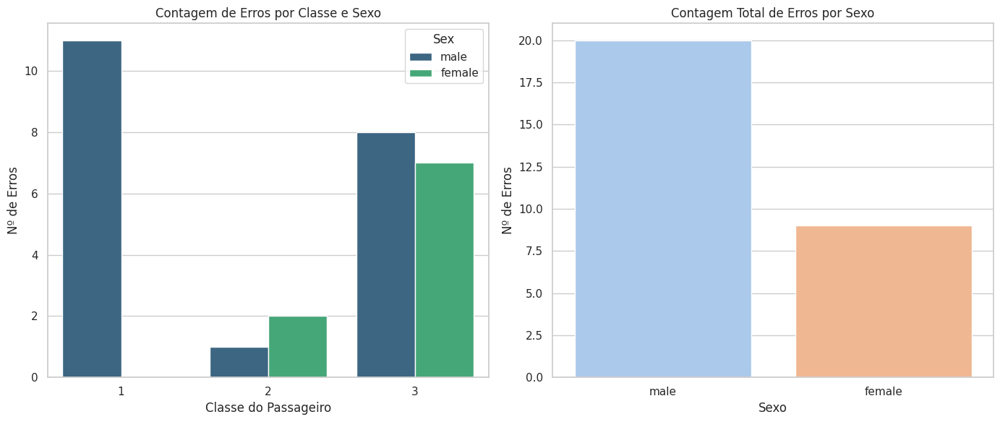

In [32]:
plt.figure(figsize=(14, 6))

# Gráfico 1: Erros por Classe Social (Pclass)
plt.subplot(1, 2, 1)
sns.countplot(data=df_erros, x='Pclass', hue='Sex', palette='viridis')
plt.title('Contagem de Erros por Classe e Sexo')
plt.xlabel('Classe do Passageiro')
plt.ylabel('Nº de Erros')

# Gráfico 2: Erros por Sexo
plt.subplot(1, 2, 2)
sns.countplot(data=df_erros, x='Sex', palette='pastel')
plt.title('Contagem Total de Erros por Sexo')
plt.xlabel('Sexo')
plt.ylabel('Nº de Erros')

plt.tight_layout()
plt.show()

Sex     female   male
Pclass               
1       100.00  45.00
2        81.82  95.83
3        70.83  82.61


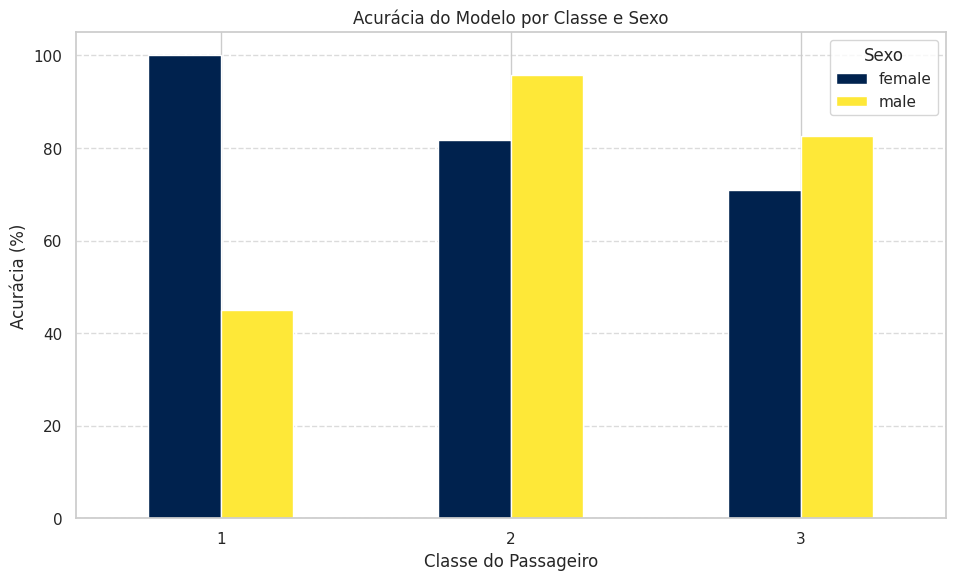

In [33]:
# Adicionando uma coluna para verificar se a previsão foi correta (1) ou não (0)
X_test_analise['Acertou'] = (X_test_analise['Real_Survived'] == X_test_analise['Predicted_Survived']).astype(int)

# Calculando a acurácia por Sexo e Classe
acuracia_por_grupo = X_test_analise.groupby(['Pclass', 'Sex'])['Acertou'].mean() * 100

print(acuracia_por_grupo.round(2).unstack())

# Plotando a acurácia por grupo
plt.figure(figsize=(10, 6))
acuracia_por_grupo.unstack().plot(kind='bar', ax=plt.gca(), colormap='cividis')
plt.title('Acurácia do Modelo por Classe e Sexo')
plt.xlabel('Classe do Passageiro')
plt.ylabel('Acurácia (%)')
plt.xticks(rotation=0)
plt.legend(title='Sexo')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

In [34]:
# Probabilidade de sobrevivência por Sexo
prob_sexo = df.groupby('Sex')['Survived'].mean() * 100
print("Probabilidade de Sobrevivência por Sexo:")
print(f"Mulheres: {prob_sexo['female']:.2f}%")
print(f"Homens: {prob_sexo['male']:.2f}%\n")

# Probabilidade de sobrevivência por Classe
prob_classe = df.groupby('Pclass')['Survived'].mean() * 100
print("Probabilidade de Sobrevivência por Classe:")
for p_class, prob in prob_classe.items():
    print(f"Classe {p_class}: {prob:.2f}%")

# Probabilidade combinada: Sexo e Classe
prob_sexo_classe = df.groupby(['Pclass', 'Sex'])['Survived'].mean() * 100
print("\nProbabilidade de Sobrevivência por Sexo e Classe:")
print(prob_sexo_classe.unstack().to_string(float_format="%.2f%%"))

Probabilidade de Sobrevivência por Sexo:
Mulheres: 75.29%
Homens: 20.53%

Probabilidade de Sobrevivência por Classe:
Classe 1: 65.22%
Classe 2: 47.98%
Classe 3: 23.94%

Probabilidade de Sobrevivência por Sexo e Classe:
Sex     female   male
Pclass               
1       96.39% 39.60%
2       91.89% 15.15%
3       46.08% 15.02%


Sexo: Você verá que a probabilidade de uma mulher sobreviver é drasticamente maior (cerca de 74%) do que a de um homem (cerca de 19%). Este é o fator preditivo mais forte no dataset.

Classe: A sobrevivência está diretamente ligada à classe social. Passageiros da 1ª classe têm a maior chance (cerca de 63%), seguidos pela 2ª (cerca de 47%) e, por último, a 3ª classe (cerca de 24%).

Combinado: A combinação revela padrões ainda mais fortes. Uma mulher da 1ª classe tem mais de 95% de chance de sobreviver, enquanto um homem da 3ª classe tem a menor chance, cerca de 13%.

## 10. Amostra Sintética Analise dos Vises do Modelo

In [35]:
# Criando os dados para 50 mulheres
mulheres_data = {
    'Pclass': np.random.choice([1, 2, 3], 50, p=[0.4, 0.3, 0.3]),
    'Sex': ['female'] * 50, 'Age': np.random.randint(15, 50, 50),
    'SibSp': np.random.choice([0, 1, 2], 50, p=[0.6, 0.3, 0.1]),
    'Parch': np.random.choice([0, 1, 2], 50, p=[0.7, 0.2, 0.1]),
    'Fare': np.random.uniform(20, 200, 50),
    'Embarked': np.random.choice(['S', 'C', 'Q'], 50, p=[0.7, 0.2, 0.1])
}
df_mulheres = pd.DataFrame(mulheres_data)

# Criando os dados para 50 homens
homens_data = {
    'Pclass': np.random.choice([1, 2, 3], 50, p=[0.2, 0.3, 0.5]),
    'Sex': ['male'] * 50, 'Age': np.random.randint(20, 50, 50),
    'SibSp': np.random.choice([0, 1], 50, p=[0.8, 0.2]),
    'Parch': [0] * 50, 'Fare': np.random.uniform(5, 50, 50),
    'Embarked': np.random.choice(['S', 'C', 'Q'], 50, p=[0.8, 0.15, 0.05])
}
df_homens = pd.DataFrame(homens_data)
df_novo_teste = pd.concat([df_mulheres, df_homens], ignore_index=True)

print("--- Amostra dos 10 primeiros passageiros criados ---")
print(df_novo_teste.head(10))

--- Amostra dos 10 primeiros passageiros criados ---
   Pclass     Sex  Age  SibSp  Parch        Fare Embarked
0       1  female   41      0      0   55.481527        S
1       2  female   24      2      2  114.193255        C
2       3  female   15      0      1  172.012770        S
3       1  female   17      1      2   24.553982        S
4       1  female   25      0      0  100.934907        Q
5       2  female   29      0      0   20.820547        S
6       2  female   27      0      0  155.856124        S
7       1  female   25      1      0   93.599693        S
8       1  female   19      0      0   44.537464        S
9       3  female   46      1      0  135.595993        C


Dados foram criados com base em distribuições aleatórias (usando np.random.choice e np.random.uniform) para simular características de passageiros que poderiam ter.

In [36]:
# Calcula as taxas de sobrevivência REAIS por classe e sexo do dataset ORIGINAL ('df')
prob_sobrevivencia = df.groupby(['Pclass', 'Sex'])['Survived'].mean()

# Mapeia essas probabilidades para cada passageiro no nosso conjunto de teste
df_novo_teste['Prob_Real'] = df_novo_teste.apply(
    lambda row: prob_sobrevivencia.loc[(row['Pclass'], row['Sex'])],
    axis=1
)

# Para cada passageiro, gere um resultado (0 ou 1) com base na sua probabilidade
# np.random.binomial(1, p) simula um evento com probabilidade 'p'
df_novo_teste['Plausible_Survived'] = df_novo_teste['Prob_Real'].apply(
    lambda p: np.random.binomial(1, p)
)

# Pré-processar e Fazer Predições com o Modelo
df_novo_teste['Pclass_Sex'] = df_novo_teste['Pclass'].astype(str) + '_' + df_novo_teste['Sex']
df_novo_teste['Pclass_Sex_Embarked'] = df_novo_teste['Pclass_Sex'] + '_' + df_novo_teste['Embarked'].astype(str)
novo_teste_dummies = pd.get_dummies(df_novo_teste, columns=categorical_cols, drop_first=True)
novo_teste_encoded = novo_teste_dummies.reindex(columns=X_train_encoded.columns, fill_value=0)
novo_teste_scaled = scaler.transform(novo_teste_encoded)

# Predição do modelo
predicoes_novas_prob = model.predict(novo_teste_scaled, verbose=0)
predicoes_novas = (predicoes_novas_prob > 0.5).astype(int).flatten()
df_novo_teste['Predicted_Survived'] = predicoes_novas

# Extrair os valores para comparação
y_plausivel = df_novo_teste['Plausible_Survived']
y_predito = df_novo_teste['Predicted_Survived']

report = classification_report(y_plausivel, y_predito, target_names=['Não Sobreviveu (0)', 'Sobreviveu (1)'])
print(report)


                    precision    recall  f1-score   support

Não Sobreviveu (0)       0.77      0.87      0.82        47
    Sobreviveu (1)       0.87      0.77      0.82        53

          accuracy                           0.82       100
         macro avg       0.82      0.82      0.82       100
      weighted avg       0.83      0.82      0.82       100



Avalia o desempenho do seu modelo treinado (a rede neural) ao fazer previsões no conjunto de dados sintético que foi criado. Ele mostra quão bem o modelo conseguiu prever os resultados "plausíveis" de sobrevivência que gerou.

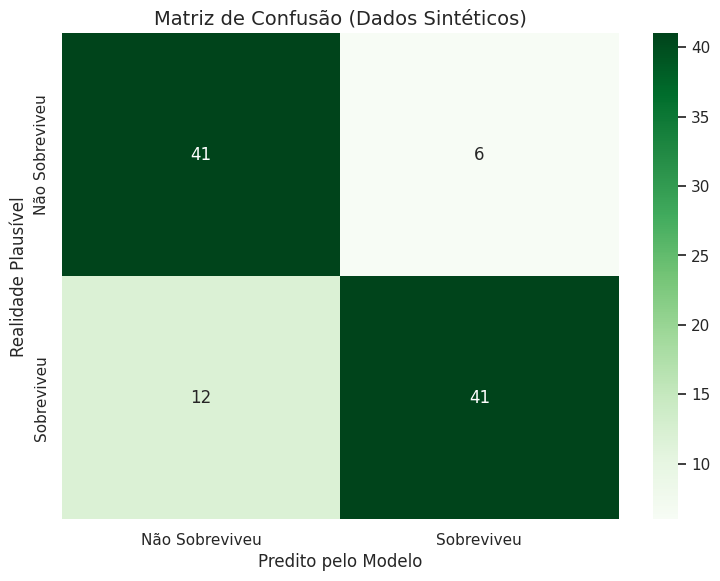

In [37]:
# Matriz de Confusão
cm = confusion_matrix(y_plausivel, y_predito)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Greens',
            xticklabels=['Não Sobreviveu', 'Sobreviveu'],
            yticklabels=['Não Sobreviveu', 'Sobreviveu'])
plt.xlabel('Predito pelo Modelo', fontsize=12)
plt.ylabel('Realidade Plausível', fontsize=12)
plt.title('Matriz de Confusão (Dados Sintéticos)', fontsize=14)
plt.show()

In [38]:
comparativo = df_novo_teste.groupby(['Pclass', 'Sex']).agg(
    Total_Passageiros=('Age', 'count'),
    Sobreviventes_Plausiveis=('Plausible_Survived', 'sum'),
    Sobreviventes_Preditos=('Predicted_Survived', 'sum')
)
print(comparativo)

               Total_Passageiros  Sobreviventes_Plausiveis  \
Pclass Sex                                                   
1      female                 19                        18   
       male                   13                         9   
2      female                 13                        13   
       male                    8                         0   
3      female                 18                        10   
       male                   29                         3   

               Sobreviventes_Preditos  
Pclass Sex                             
1      female                      19  
       male                         5  
2      female                      13  
       male                         0  
3      female                      10  
       male                         0  
